# Dark-Fiber Charakterisierung für entanglement polarisierter QKD

<b><h3>Zusammenhang von Umwelteinflüssen (Wetter) und Messdaten</h3></b>

Author: Laura Komma  
Dataset: Nordhausen - Sundhausen (<a href="https://zenodo.org/uploads/15183223">29.11.2024_10d.csv</a>)

## Wetterdaten

Als Datengrundlage für die Umwelteinflüsse dienen die Open-Source Wetterdaten von <a href="https://open-meteo.com/">Open-Meteo.com</a> 

Für einen Überblick zum Erreichen und Verwenden der Daten kann die <a href="https://open-meteo.com/en/docs">Dokumentation</a> genutzt werden!

<a href="https://stjerneskinn.com/sonnenaufgang-nordhausen.htm">Quelle für Sonnenauf- und -untergangszeiten</a>

In [1]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import io
import datetime

In [2]:
# Nordhausen - Breitengrad: 51.5 & Längengrad: 10.8

url = (
    "https://archive-api.open-meteo.com/v1/archive?"
    "latitude=51.5&longitude=10.8&"
    "start_date=2024-11-29&end_date=2024-12-03&"
    "hourly=temperature_2m,relative_humidity_2m,cloud_cover,wind_speed_10m,wind_direction_10m,rain&"
    "timezone=Europe/Berlin"
)

response = requests.get(url)

if response.status_code == 200:
    data = response.json()
    weather = pd.DataFrame(data["hourly"])
    print(weather.head())
else:
    print("Fehler beim Abrufen:", response.status_code)
    print(response.text)

               time  temperature_2m  relative_humidity_2m  cloud_cover  \
0  2024-11-29T00:00             4.3                    86          100   
1  2024-11-29T01:00             4.0                    88           99   
2  2024-11-29T02:00             3.9                    88           99   
3  2024-11-29T03:00             3.4                    92           50   
4  2024-11-29T04:00             2.6                    95           77   

   wind_speed_10m  wind_direction_10m  rain  
0            12.6                 287   0.0  
1            12.3                 280   0.0  
2            12.6                 275   0.0  
3            10.3                 277   0.0  
4             9.4                 275   0.0  


In [3]:
units = data['hourly_units']
weather_columns = []
for key, value in units.items():
    weather_columns.append(f'{key} [{value}]')

weather.columns = weather_columns
weather.head()

,time [iso8601],temperature_2m [°C],relative_humidity_2m [%],cloud_cover [%],wind_speed_10m [km/h],wind_direction_10m [°],rain [mm]
0,2024-11-29T00:00,4.3,86,100,12.6,287,0.0
1,2024-11-29T01:00,4.0,88,99,12.3,280,0.0
2,2024-11-29T02:00,3.9,88,99,12.6,275,0.0
3,2024-11-29T03:00,3.4,92,50,10.3,277,0.0
4,2024-11-29T04:00,2.6,95,77,9.4,275,0.0


In [4]:
weather.to_csv("open-meteo_nordhausen.csv", index=False)

In [5]:
w_data = [
    {"header": "temperature_2m [°C]", "color" : "tab:red", "unit": "°C", "label": "Temperature"},
    {"header": "relative_humidity_2m [%]", "color" : "tab:purple", "unit": "%", "label": "Humidity"},
    {"header": "cloud_cover [%]", "color" : "tab:gray", "unit": "%", "label": "Cloud Cover"},
    {"header": "wind_speed_10m [km/h]", "color" : "tab:green", "unit": "km/h", "label": "Windspeed"},
    {"header": "wind_direction_10m [°]", "color" : "tab:orange", "unit": "°", "label": "Winddirection"},
    {"header": "rain [mm]", "color" : "tab:cyan", "unit": "mm", "label": "Rain"}
]

for i in range(len(w_data)):
    print(f'{i}: {w_data[i]["label"]}')


0: Temperature
1: Humidity
2: Cloud Cover
3: Windspeed
4: Winddirection
5: Rain


In [6]:
sunrise = [
    datetime.datetime.strptime('2024-11-29 07:57:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2024-11-30 07:59:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2024-12-01 08:00:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2024-12-02 08:02:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2024-12-03 08:03:00', '%Y-%m-%d %H:%M:%S')
]
sunset =  [
    datetime.datetime.strptime('2024-11-29 16:12:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2024-11-30 16:11:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2024-12-01 16:11:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2024-12-02 16:10:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2024-12-03 16:09:00', '%Y-%m-%d %H:%M:%S')
]

In [7]:
weather[weather_columns[0]] = pd.to_datetime(weather[weather_columns[0]])
weather.set_index(weather_columns[0], inplace=True)

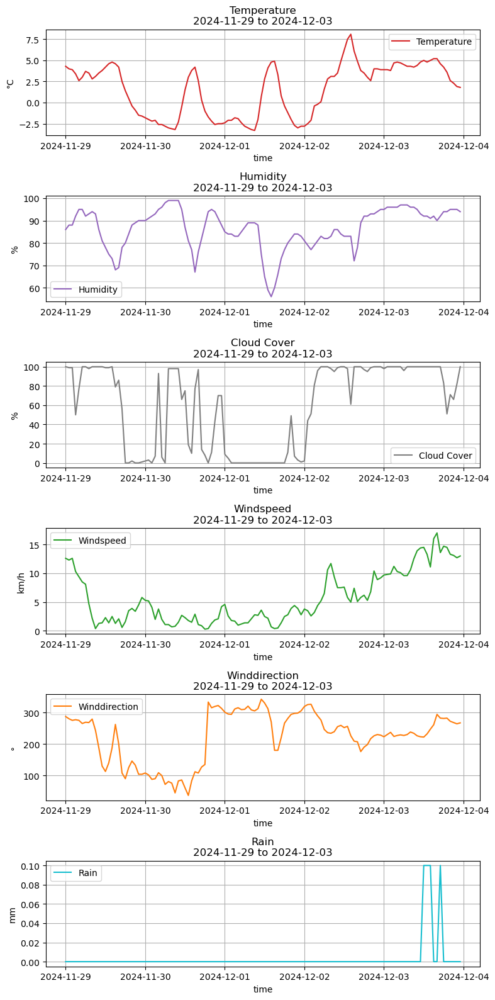

In [8]:
fig, axs = plt.subplots(len(w_data), 1, figsize=(8, 16), sharex=False)

for i in range(len(w_data)):
    ax = axs[i] if len(weather_columns) > 1 else axs
    ax.plot(weather.index, weather[w_data[i]["header"]], label =w_data[i]["label"], color=w_data[i]["color"])

    ax.grid()
    ax.legend(loc='best')
    ax.set_title(f'{w_data[i]["label"]}\n{weather.index[0].strftime("%Y-%m-%d")} to {weather.index[-1].strftime("%Y-%m-%d")}')
    ax.set_xlabel("time")
    ax.set_ylabel(w_data[i]["unit"])

plt.tight_layout()
plt.show()

## Zusammenhang von Wetter und Messdaten

In [9]:
filename ='29.11.2024_10d.csv'
skip = 8
sep = ";"

columns = ['Time[date hh:mm:ss] ', ' Elapsed Time [hh:mm:ss:ms]', ' Normalized s 1 ', ' Normalized s 2 ', ' Normalized s 3 ', ' S 0 [mW]', ' S 1 [mW]', ' S 2 [mW]', ' S 3 [mW]', ' Azimuth[°] ', ' Ellipticity[°] ', ' DOP[%] ', ' DOCP[%] ', ' DOLP[%] ', ' Power[mW] ', ' Pol Power[mW] ', ' Unpol Power[mW] ', ' Power[dBm] ', ' Pol Power[dBm] ', ' Unpol Power[dBm] ', ' Power-Split-Ratio ', ' Phase Difference[°] ', ' Warning']
for c in range(len(columns)):
    print(c, ': ', columns[c])

0 :  Time[date hh:mm:ss] 
1 :   Elapsed Time [hh:mm:ss:ms]
2 :   Normalized s 1 
3 :   Normalized s 2 
4 :   Normalized s 3 
5 :   S 0 [mW]
6 :   S 1 [mW]
7 :   S 2 [mW]
8 :   S 3 [mW]
9 :   Azimuth[°] 
10 :   Ellipticity[°] 
11 :   DOP[%] 
12 :   DOCP[%] 
13 :   DOLP[%] 
14 :   Power[mW] 
15 :   Pol Power[mW] 
16 :   Unpol Power[mW] 
17 :   Power[dBm] 
18 :   Pol Power[dBm] 
19 :   Unpol Power[dBm] 
20 :   Power-Split-Ratio 
21 :   Phase Difference[°] 
22 :   Warning


### Degree of Polarization (DOP[%])

In [10]:
degree = pd.read_csv(filename,skiprows=skip, sep=sep, usecols=[columns[0], columns[11]])

In [11]:
degree[columns[0]] = pd.to_datetime(degree[columns[0]])
degree.set_index(columns[0], inplace=True)

#### Aufteilung nach Tagen

In [12]:
degree = degree[columns[11]]
degree = degree.drop(degree[(degree > 140) | (degree < 0)].index)

degree_daily = degree.groupby(degree.index.date)
degree_daily_list = list(degree_daily)

In [13]:
weather_daily = weather.groupby(weather.index.date)
weather_daily_list = list(weather_daily)

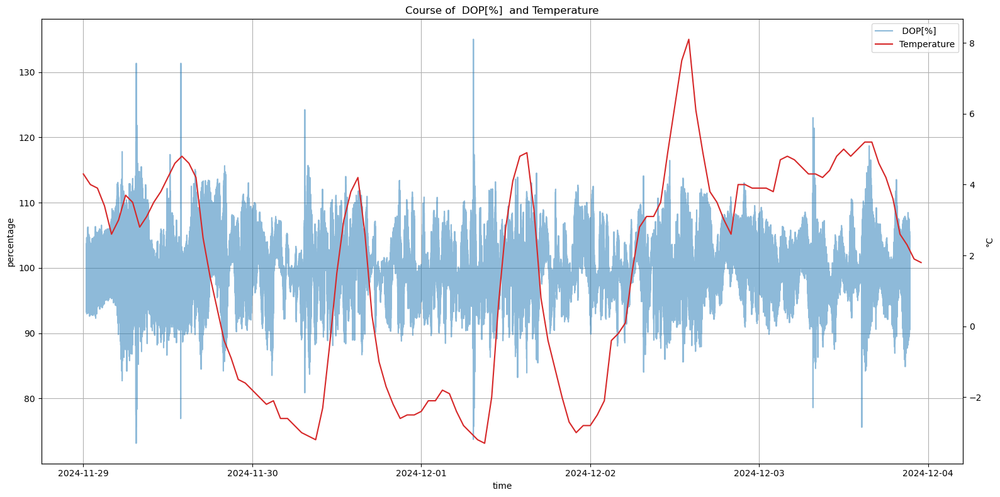

In [22]:
current = 0 #Temperature

fig, ax1 = plt.subplots(figsize=(16, 8))
   
ax1.plot(degree.index, degree, label=columns[11], color="tab:blue", alpha = 0.5 )
ax1.set_xlabel('time')
ax1.set_ylabel('percentage')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Course of {columns[11]} and {w_data[current]["label"]}')
    
plt.tight_layout()
plt.show()

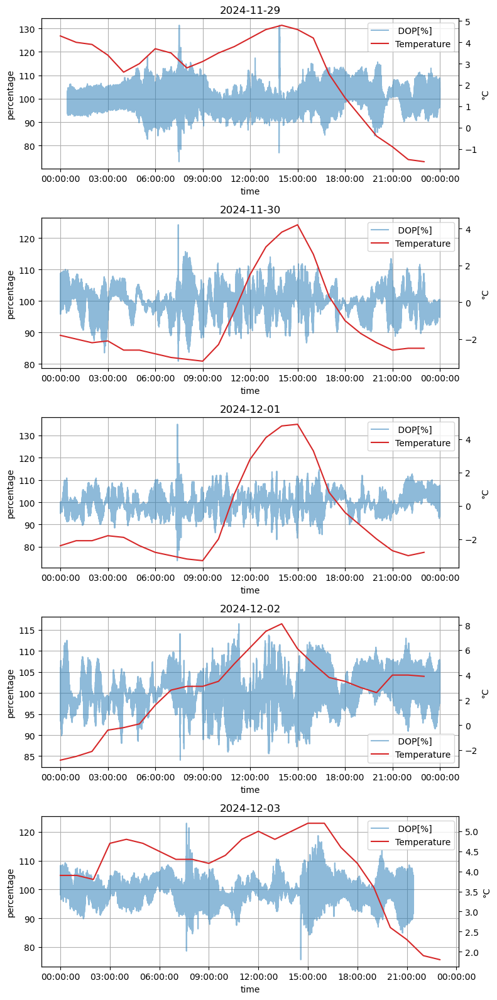

In [23]:
current = 0 # Temperature

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]

    ax1.plot(df_day.index, df_day, label=columns[11], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

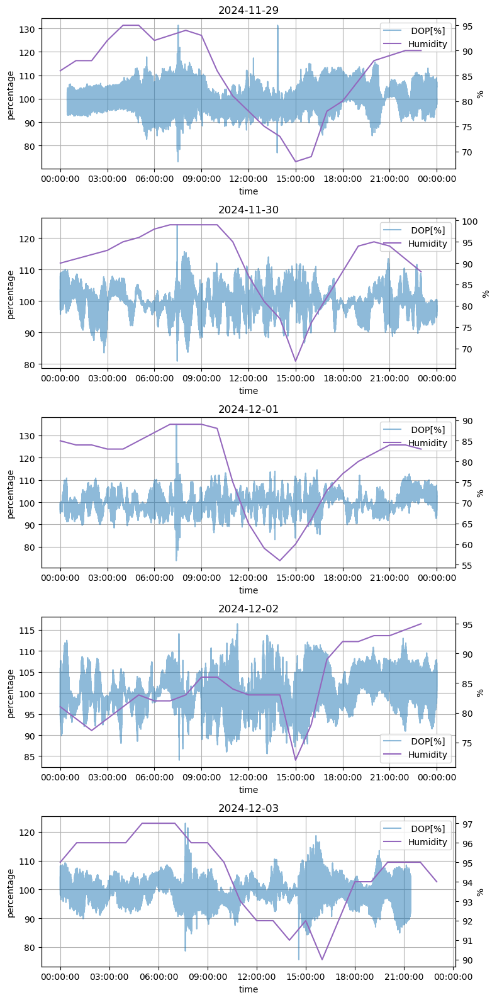

In [24]:
current = 1 # Humidity

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]

    ax1.plot(df_day.index, df_day, label=columns[11], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

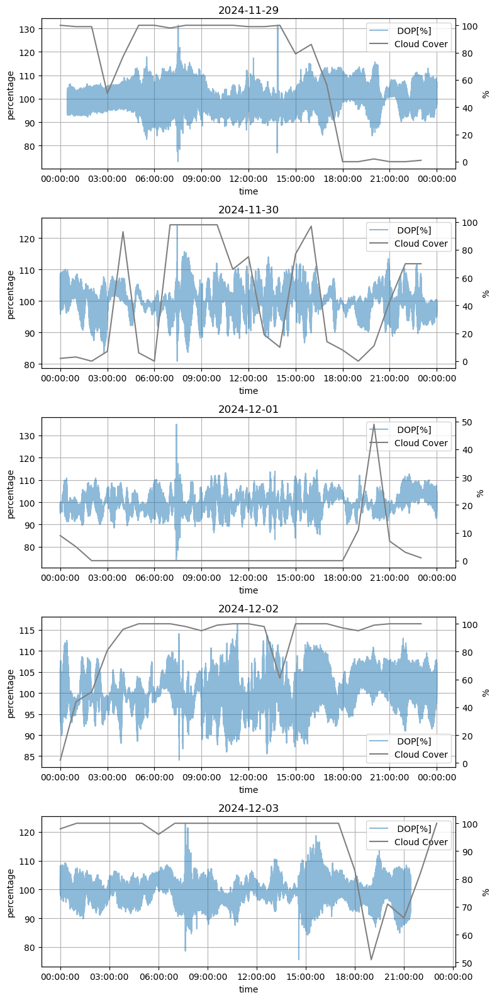

In [25]:
current = 2 # Cloud Cover

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]

    ax1.plot(df_day.index, df_day, label=columns[11], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

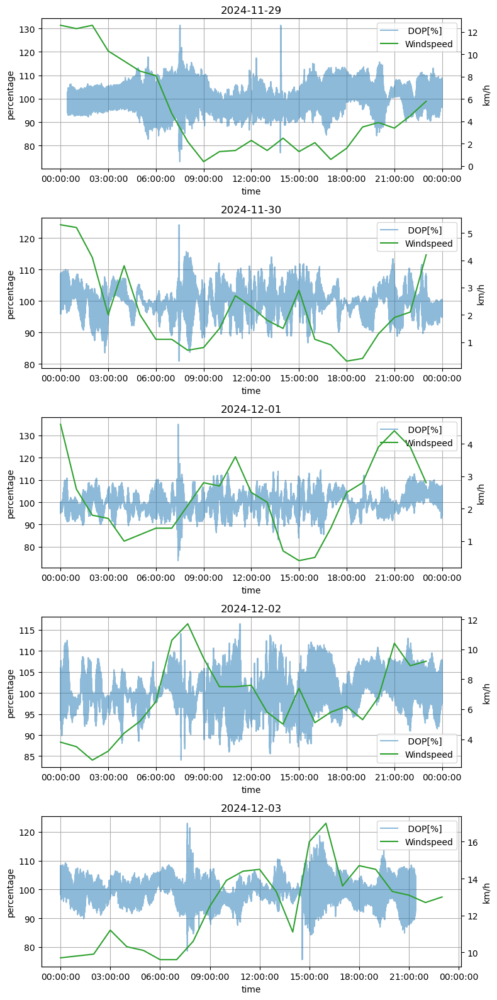

In [26]:
current = 3 # Windspeed

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]

    ax1.plot(df_day.index, df_day, label=columns[11], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

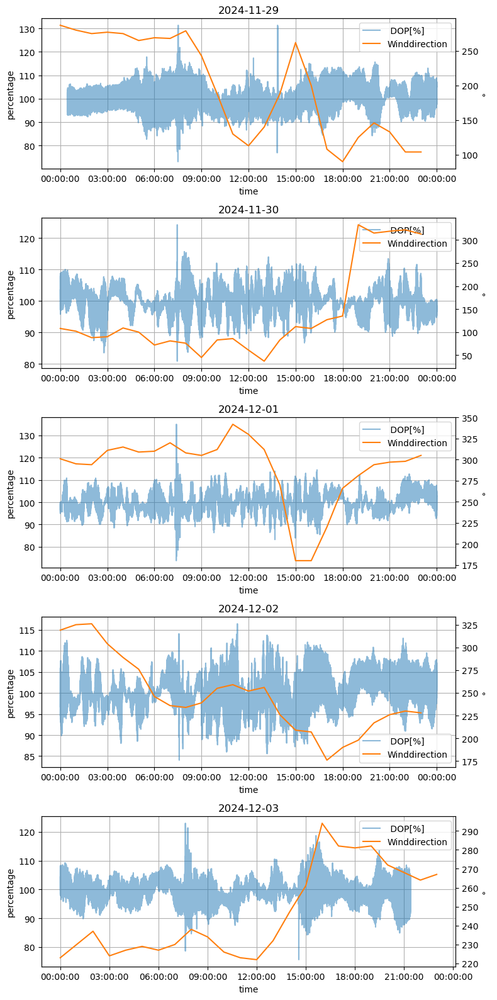

In [27]:
current = 4 # Winddirection

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]

    ax1.plot(df_day.index, df_day, label=columns[11], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

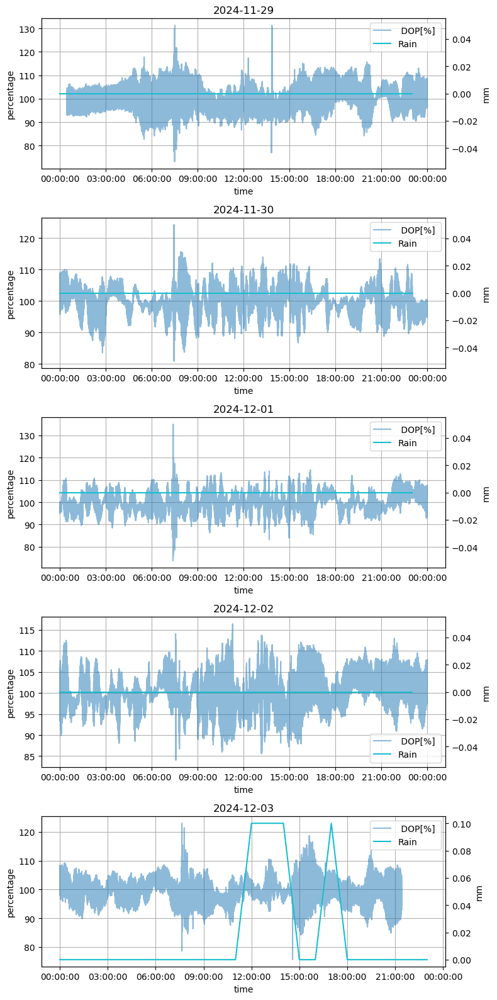

In [28]:
current = 5 # Rain

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]

    ax1.plot(df_day.index, df_day, label=columns[11], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

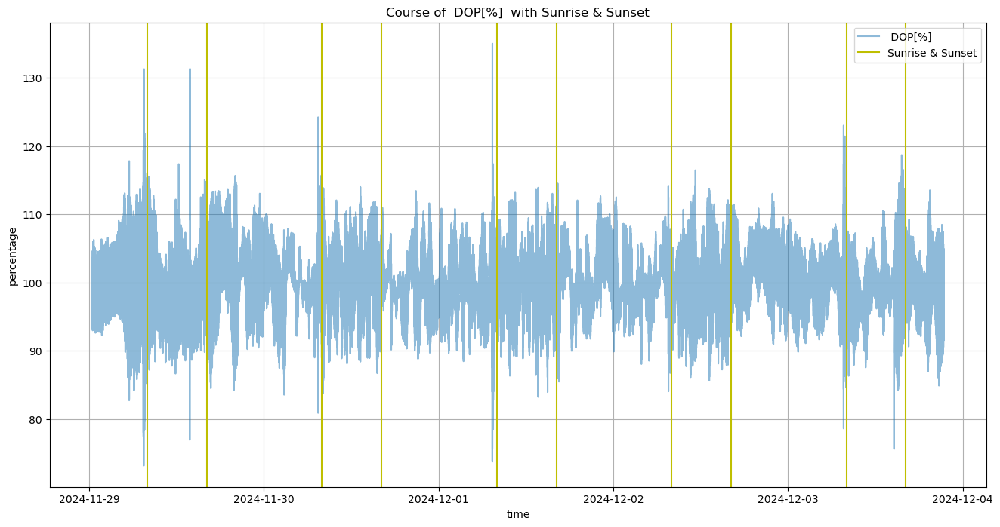

In [43]:
# Sunlight (day-night context)

plt.figure(figsize = (16,8))
plt.plot(degree.index, degree, label=columns[11], alpha = 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y')
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: plt.axvline(x = sunset[i], color = 'y')
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Course of {columns[11]} with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('percentage')
plt.show()

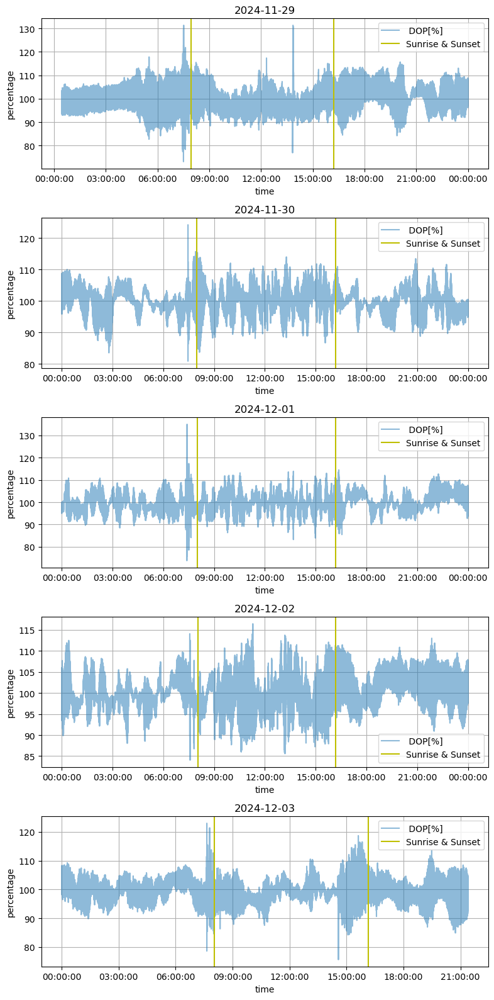

In [29]:
# Sunlight (day-night context)

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]

    ax1.plot(df_day.index, df_day, label=columns[11], alpha=0.5)
    ax1.axvline(x = sunrise[i], color = 'y')
    ax1.axvline(x = sunset[i], color = 'y', label = 'Sunrise & Sunset')
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    ax1.grid()
    ax1.legend(loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

#### Anwendung von Tief- und Hochpass-Filtern

In [30]:
def lowpass(data, box = 100):
    box = box
    LP_filter = np.full(int(box), 1/box) 
    lps = np.convolve(ydata, LP_filter)
    lps = lps[ int((box-1) / 2) :len(lps) - int((box - 1) / 2)]
    return lps

def highpass(data, box = 100):
    lps = lowpass(data, box)
    hps = data - lps[:-1]
    return hps

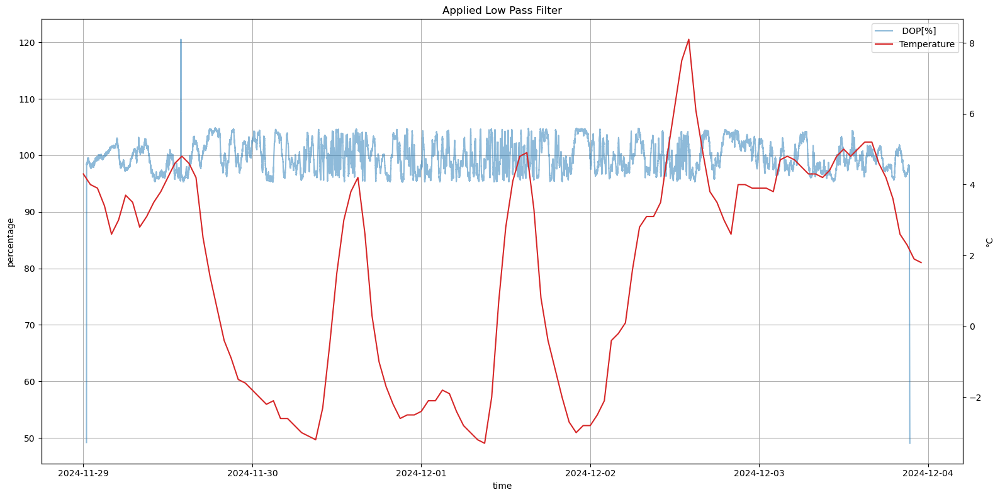

In [34]:
current = 0 #Temperature

fig, ax1 = plt.subplots(figsize=(16, 8))

ydata = np.array(degree)
lps = lowpass(ydata, 1000)
   
ax1.plot(degree.index, lps[:-1] , label=columns[11], color="tab:blue", alpha = 0.5 )
ax1.set_xlabel('time')
ax1.set_ylabel('percentage')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Applied Low Pass Filter')
    
plt.tight_layout()
plt.show()

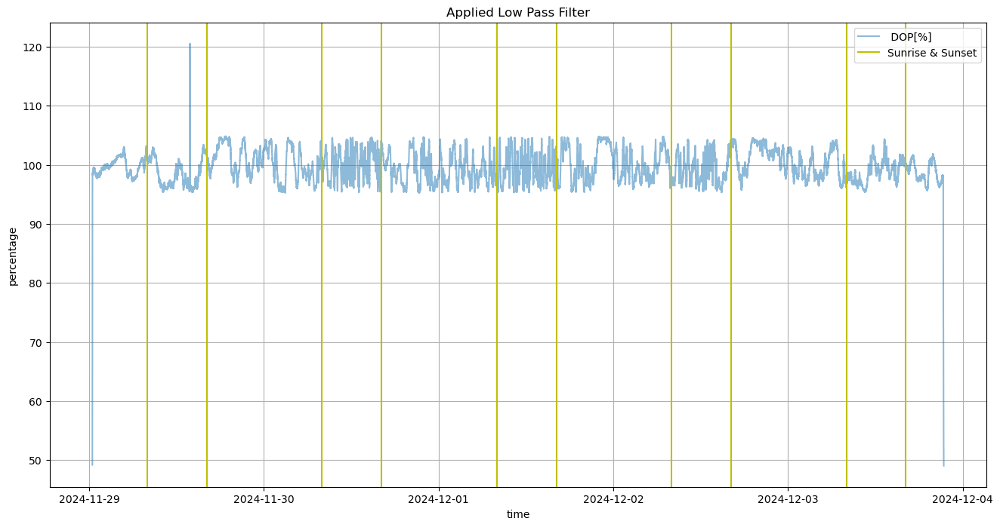

In [44]:
# Sunlight (day-night context)

plt.figure(figsize = (16,8))
ydata = np.array(degree)
lps = lowpass(ydata, 1000)
plt.plot(degree.index, lps[:-1], label=columns[11], alpha = 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y')
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: plt.axvline(x = sunset[i], color = 'y')
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Applied Low Pass Filter')
plt.xlabel('time')
plt.ylabel('percentage')
plt.show()

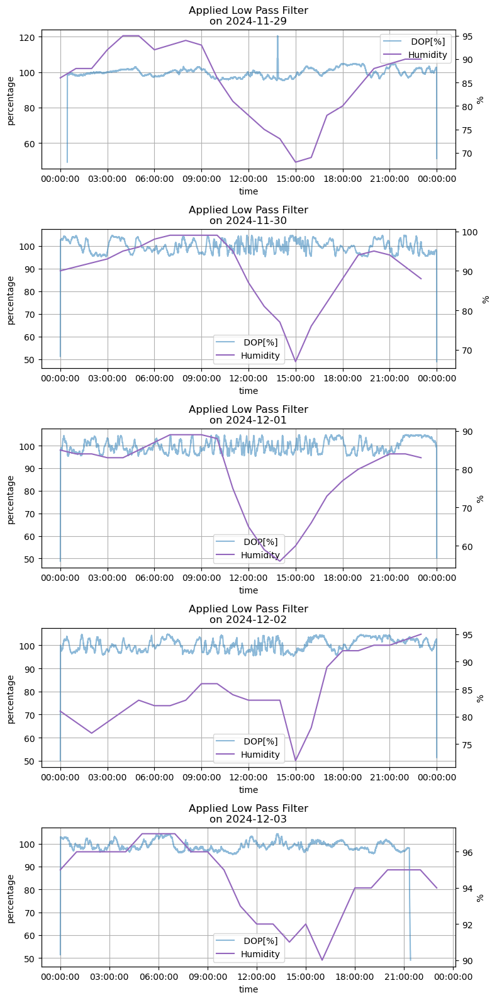

In [32]:
current = 1 # Humidity

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]
    
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[11], alpha = 0.5 )
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

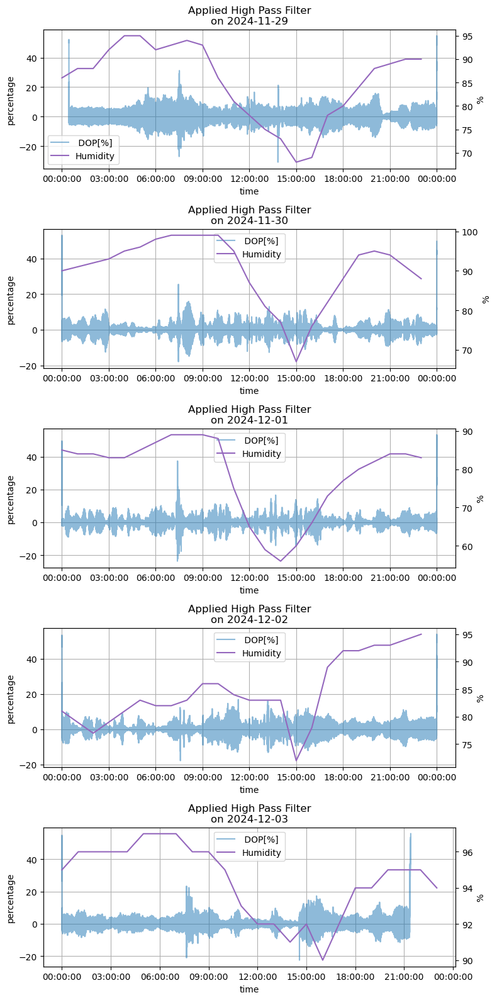

In [33]:
current = 1 # Humidity

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]
    
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[11], alpha = 0.5 )
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

### Winkel (Azimuth, Ellipticity)

In [45]:
angle = pd.read_csv(filename,skiprows=skip, sep=sep, usecols=[columns[0], columns[9], columns[10]])

In [46]:
angle[columns[0]] = pd.to_datetime(angle[columns[0]])
angle.set_index(columns[0], inplace=True)

#### Aufteilung nach Tagen

In [48]:
angle_daily = angle.groupby(angle.index.date)
angle_daily_list = list(angle_daily)

angle_daily = angle.groupby(angle.index.date)
angle_daily_list = list(angle_daily)

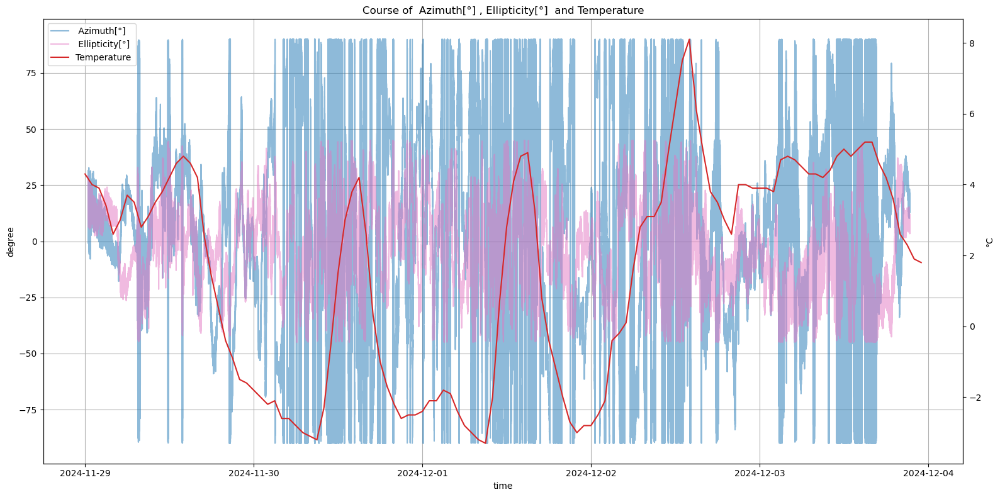

In [56]:
current = 0 #Temperature

fig, ax1 = plt.subplots(figsize=(16, 8))
   
ax1.plot(angle.index, angle[columns[9]], label=columns[9], color= "tab:blue", alpha= 0.5)
ax1.plot(angle[columns[10]], label=columns[10], color= "tab:pink", alpha= 0.5)
ax1.set_xlabel('time')
ax1.set_ylabel('degree')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Course of {columns[9]},{columns[10]} and {w_data[current]["label"]}')
    
plt.tight_layout()
plt.show()

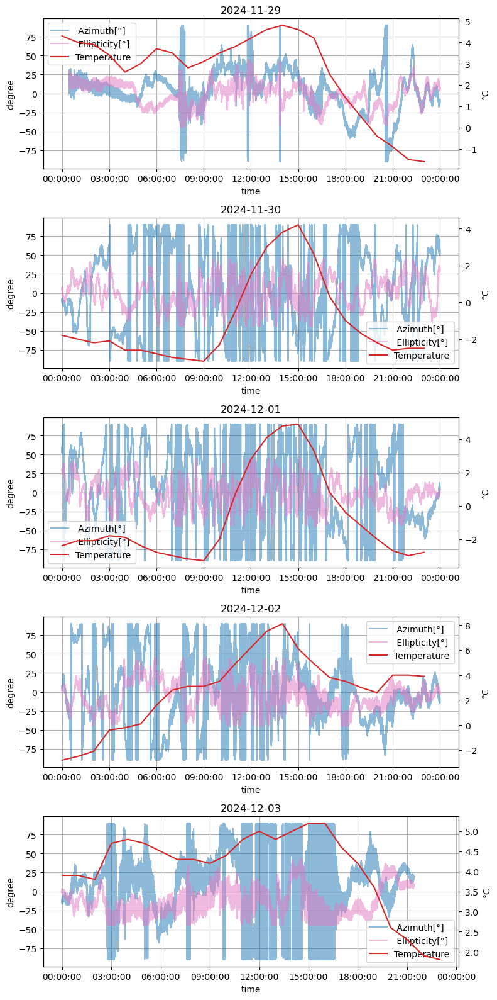

In [51]:
current = 0 # Temperature

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    az = angle_daily_list[i][1][columns[9]]
    el = angle_daily_list[i][1][columns[10]]

    ax1.plot(angle_daily_list[i][1].index, az, label=columns[9], color=angle_colors["az"], alpha= 0.5)
    ax1.plot(el, label=columns[10], color=angle_colors["el"], alpha= 0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

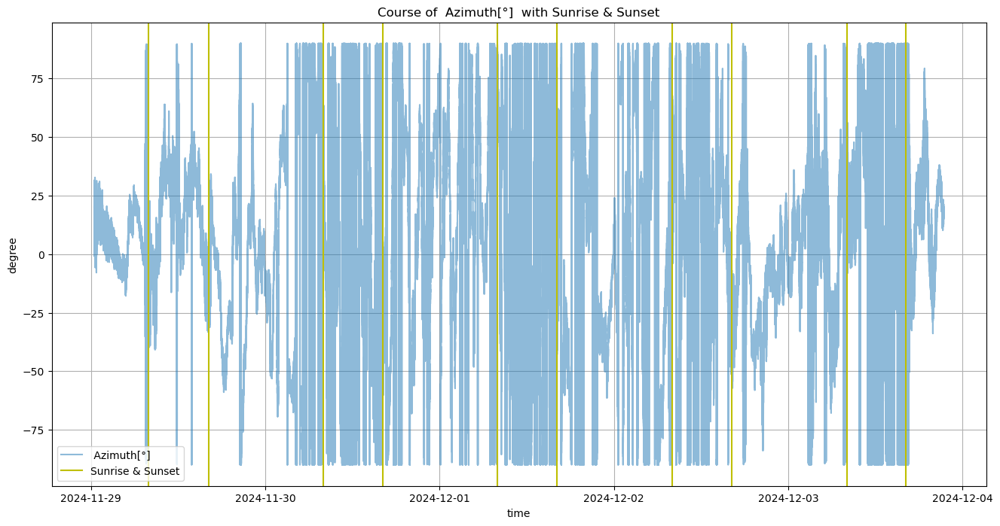

In [54]:
# Sunlight (day-night context)

plt.figure(figsize = (16,8))
plt.plot(angle.index, angle[columns[9]], label=columns[9], alpha= 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y')
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: plt.axvline(x = sunset[i], color = 'y')
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Course of {columns[9]} with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('degree')
plt.show()

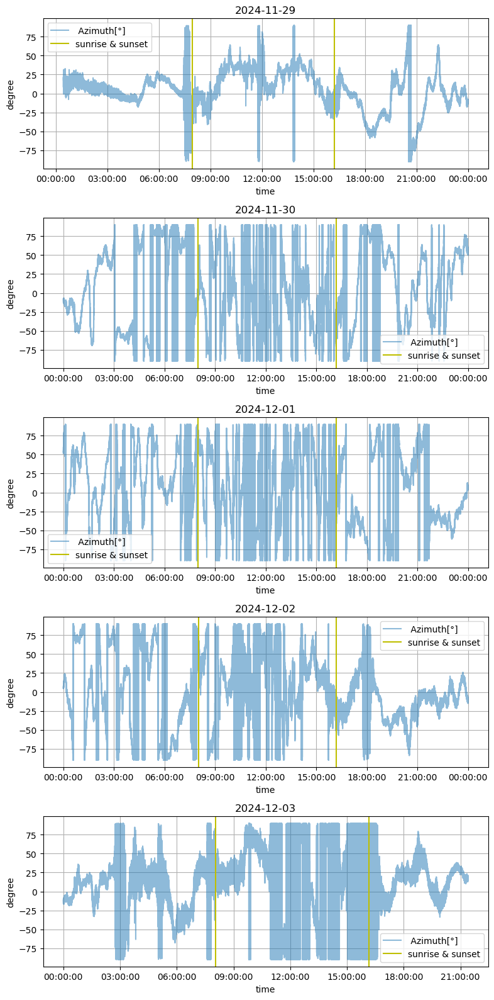

In [57]:
# Sunlight (day-night context)

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    az = angle_daily_list[i][1][columns[9]]

    ax1.plot(angle_daily_list[i][1].index, az, label=columns[9], alpha=0.5)
    ax1.axvline(x = sunrise[i], color = 'y')
    ax1.axvline(x = sunset[i], color = 'y', label = 'sunrise & sunset')
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    
    ax1.grid()
    ax1.legend(loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

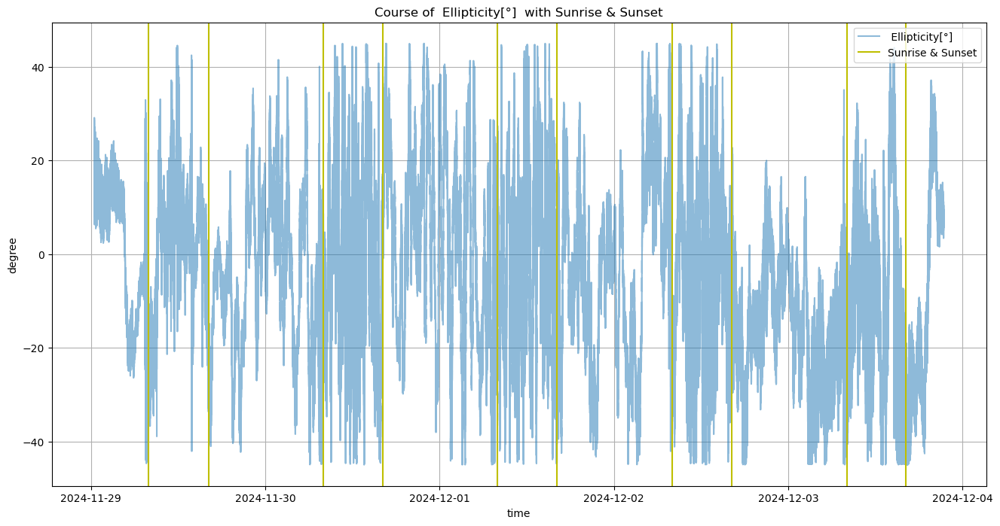

In [55]:
# Sunlight (day-night context)

plt.figure(figsize = (16,8))
plt.plot(angle.index, angle[columns[10]], label=columns[10], alpha= 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y')
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: plt.axvline(x = sunset[i], color = 'y')
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Course of {columns[10]} with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('degree')
plt.show()

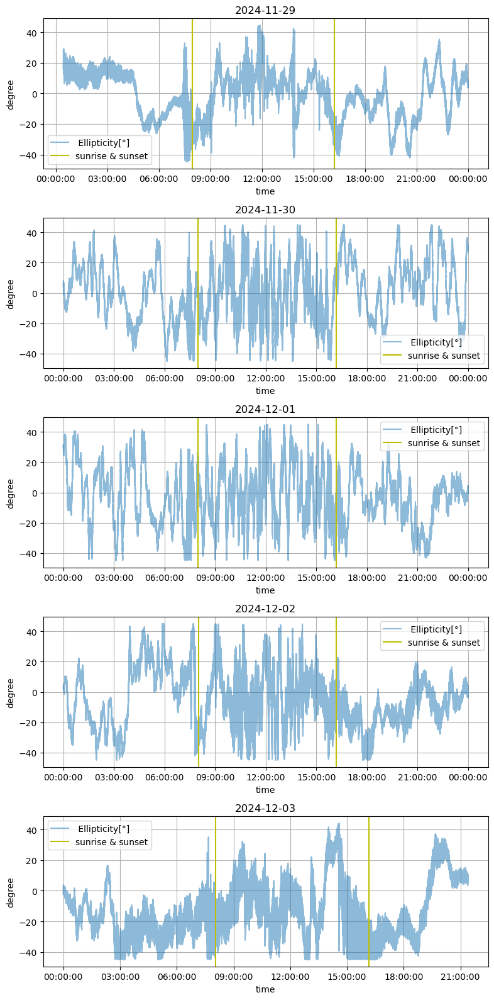

In [58]:
# Sunlight (day-night context)

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    df_day = angle_daily_list[i][1][columns[10]]

    ax1.plot(angle_daily_list[i][1].index, df_day, label=columns[10], alpha=0.5)
    ax1.axvline(x = sunrise[i], color = 'y')
    ax1.axvline(x = sunset[i], color = 'y', label = 'sunrise & sunset')
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    
    ax1.grid()
    ax1.legend(loc="best")
    ax1.set_title(angle_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

#### Anwendung vom Tiefpass-Filter

<b>Azimuth</b>

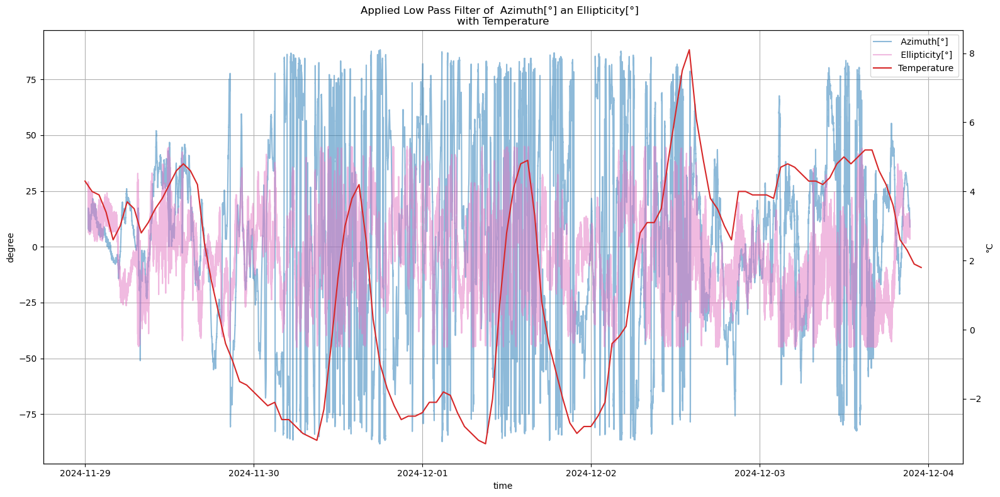

In [91]:
current = 0 #Temperature

fig, ax1 = plt.subplots(figsize=(16, 8))

ydata = np.array(angle[columns[9]])
lps = lowpass(ydata, 1000)
   
ax1.plot(angle.index, lps[:-1], label=columns[9], color= "tab:blue", alpha= 0.5)

ydata = np.array(angle[columns[10]])
lps = lowpass(ydata, 1000)
ax1.plot(angle[columns[10]], label=columns[10], color= "tab:pink", alpha= 0.5)

ax1.set_xlabel('time')
ax1.set_ylabel('degree')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Applied Low Pass Filter of {columns[9]}an{columns[10]} \nwith {w_data[current]["label"]}')
    
plt.tight_layout()
plt.show()

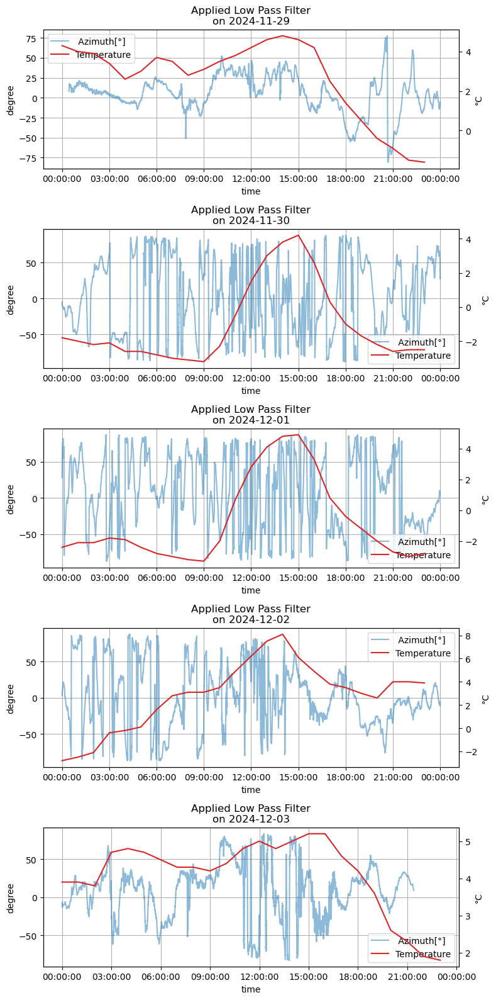

In [59]:
current = 0 # Temperature

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

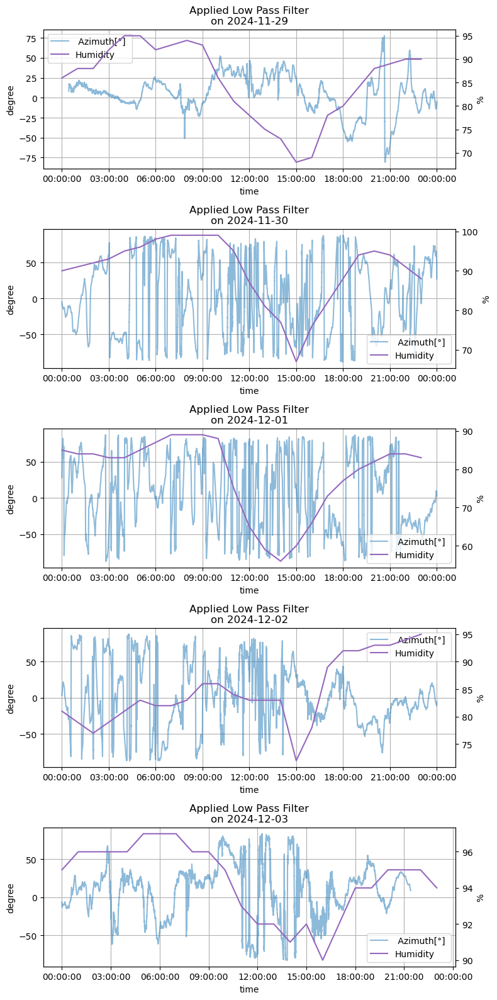

In [60]:
current = 1 # Humidity

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

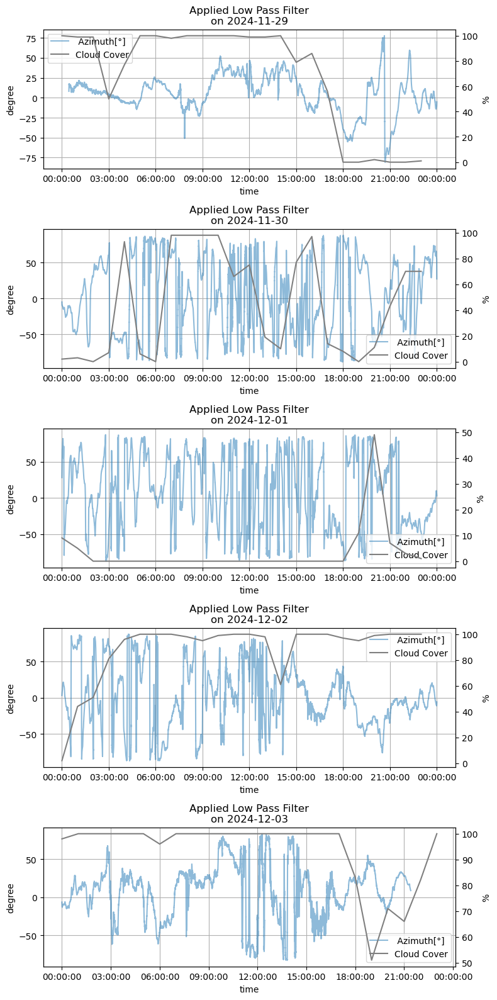

In [61]:
current = 2 # Cloud Cover

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

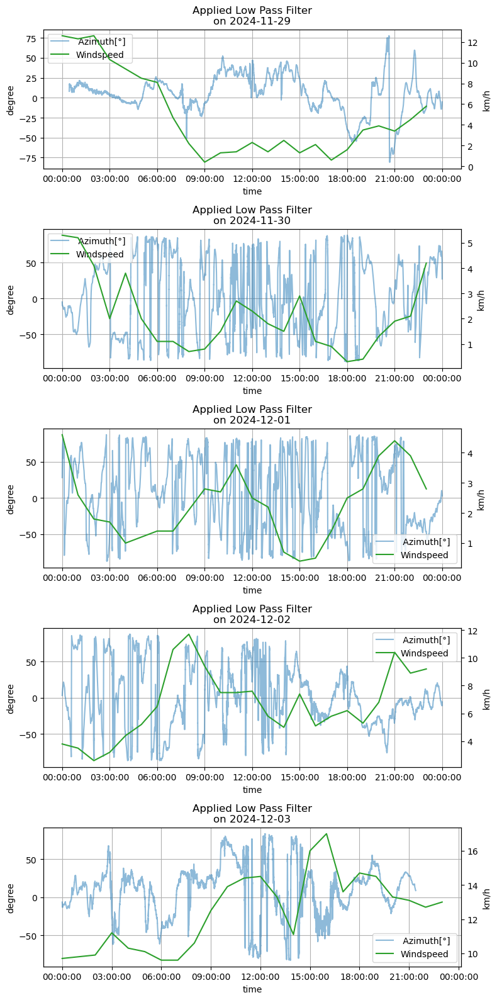

In [62]:
current = 3 # Windspeed

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

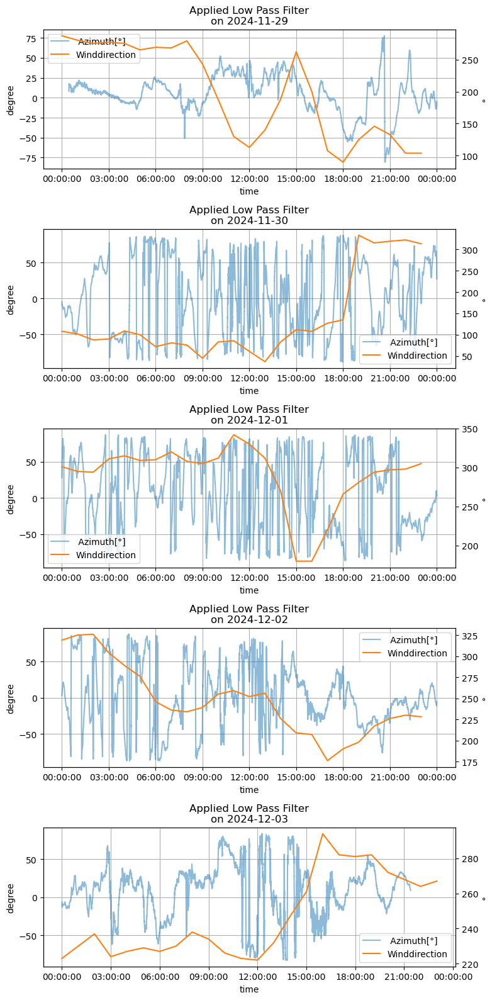

In [63]:
current = 4 # Winddirection

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

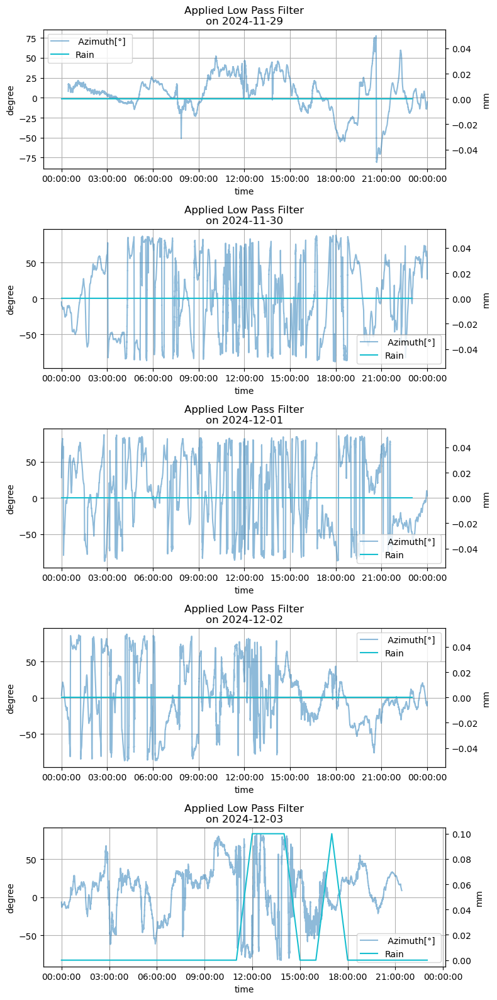

In [64]:
current = 5 # Rain

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

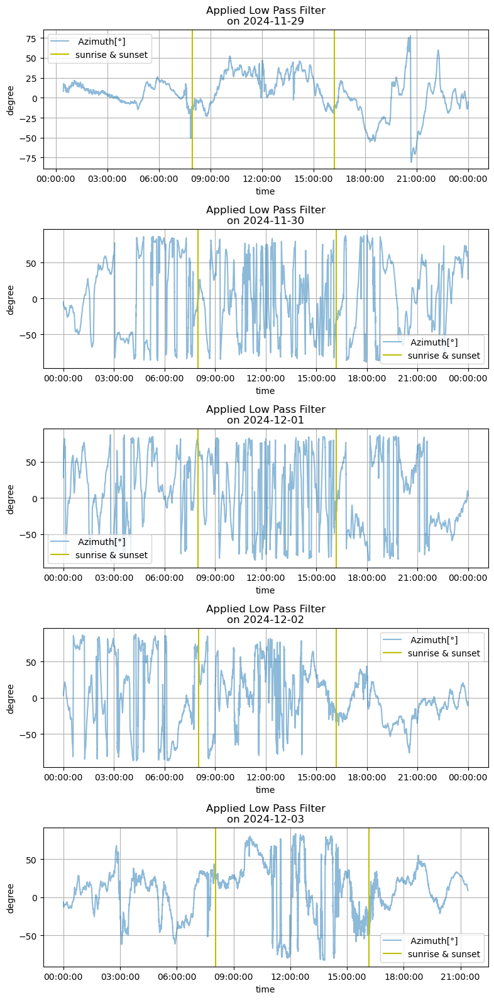

In [66]:
# Sunlight (day-night context)

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[9], alpha=0.5)
    ax1.axvline(x = sunrise[i], color = 'y')
    ax1.axvline(x = sunset[i], color = 'y', label = 'sunrise & sunset')
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

<b>Ellipticity</b>

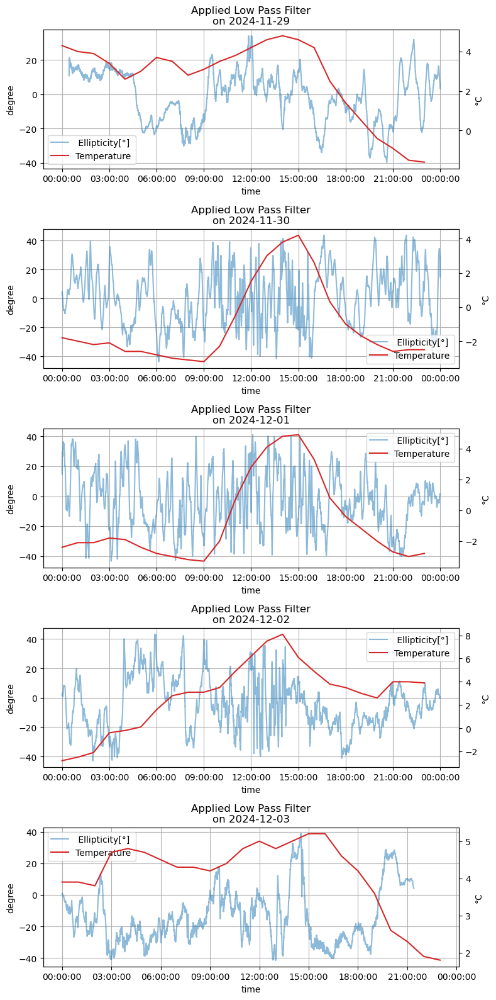

In [67]:
current = 0 # Temperature

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

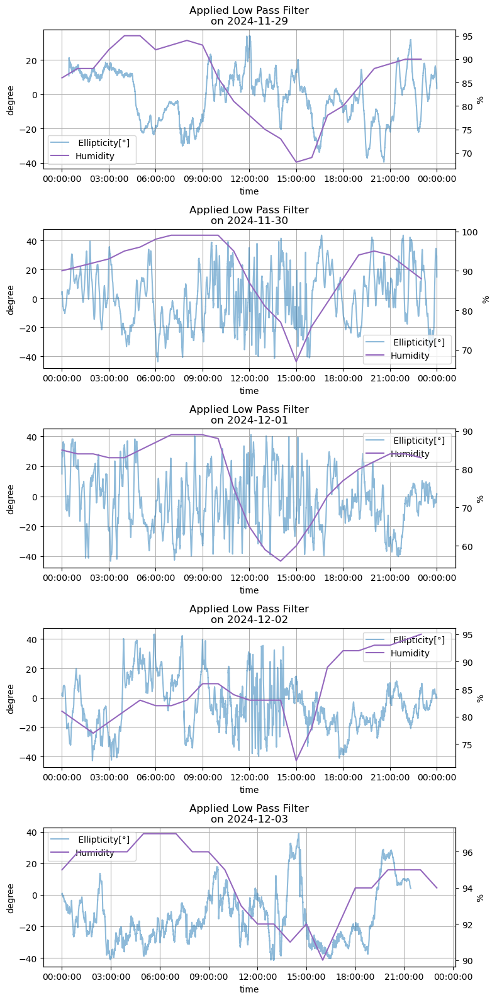

In [68]:
current = 1 # Humidity

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

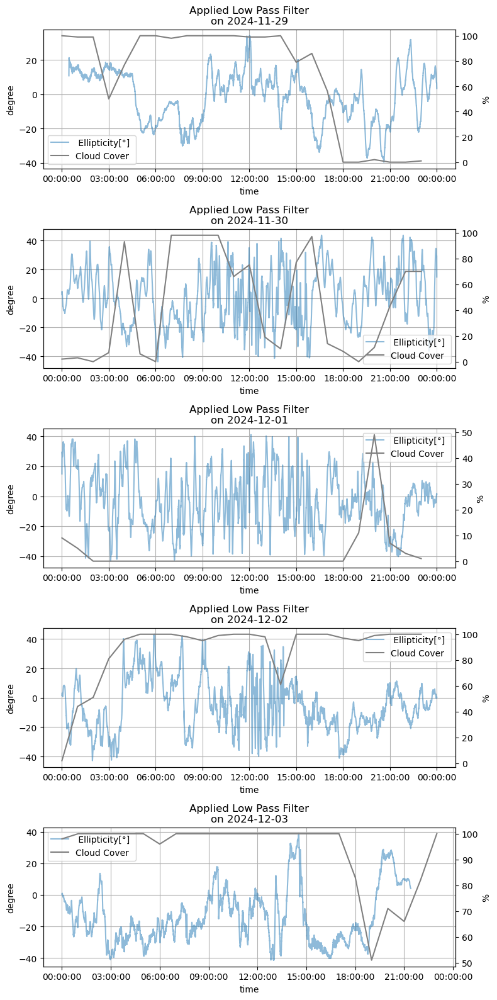

In [69]:
current = 2 # Cloud Cover

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

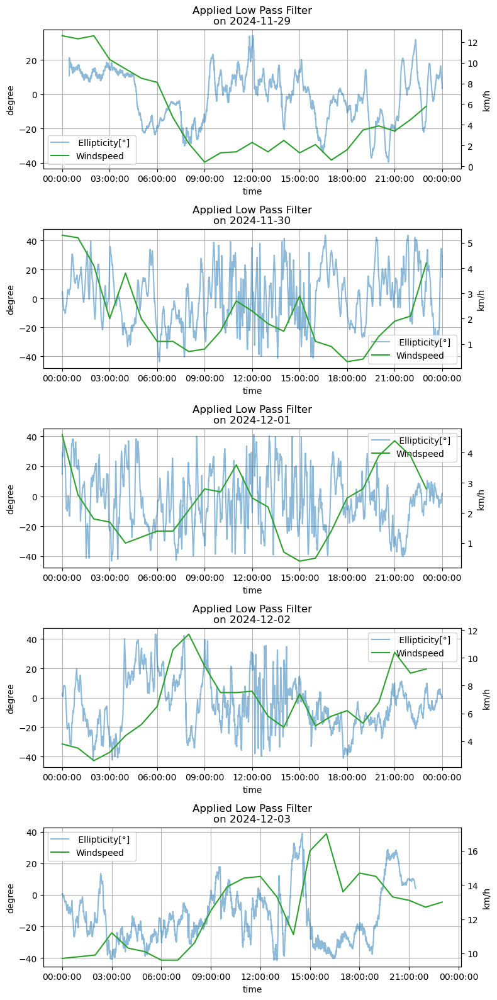

In [70]:
current = 3 # Windspeed

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

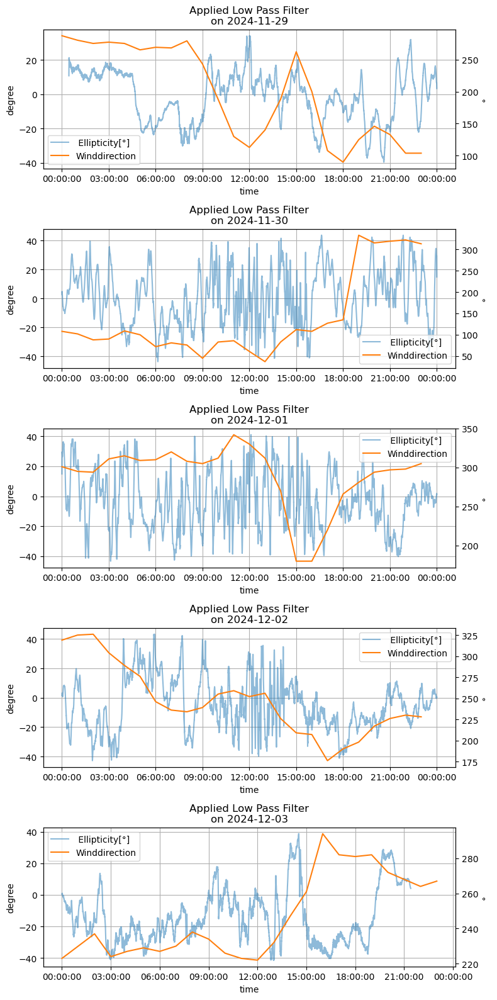

In [71]:
current = 4 # Winddirection

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

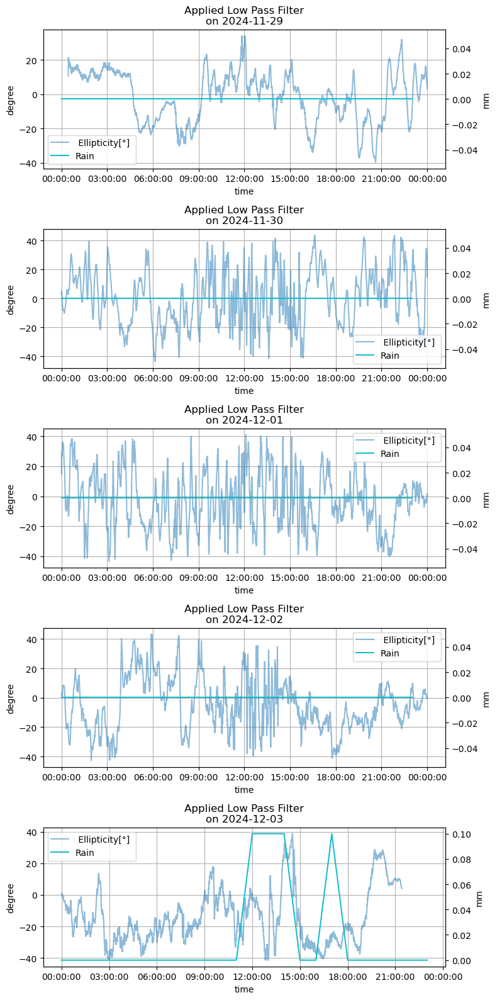

In [72]:
current = 5 # Rain

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

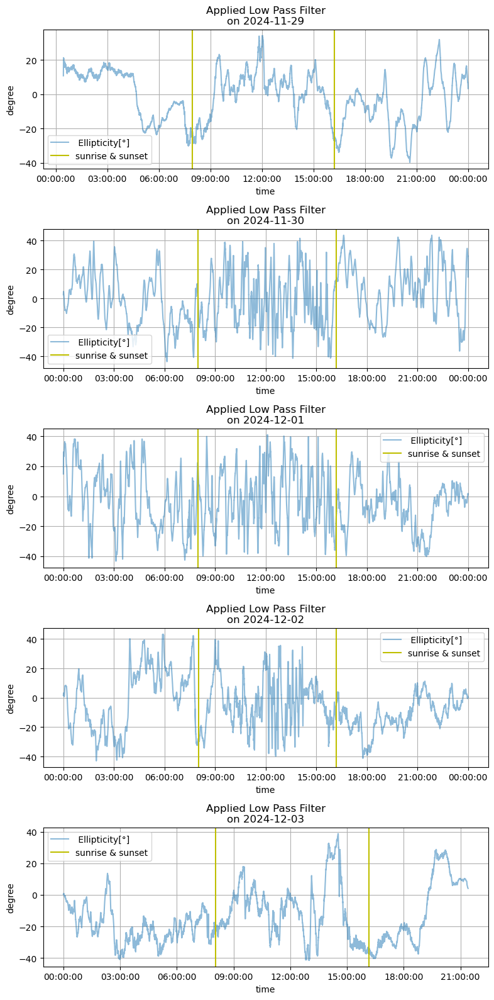

In [89]:
# Sunlight (day-night context)

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    lps = lowpass(ydata, 1000)

    ax1.plot(df_day.index, lps[:-1], label=columns[10], alpha = 0.5)
    ax1.axvline(x = sunrise[i], color = 'y')
    ax1.axvline(x = sunset[i], color = 'y', label = 'sunrise & sunset')
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    
    ax1.grid()
    ax1.legend(loc="best")
    ax1.set_title(f'Applied Low Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

#### Anwendung vom Hochpass-Filter

<b>Azimuth</b>

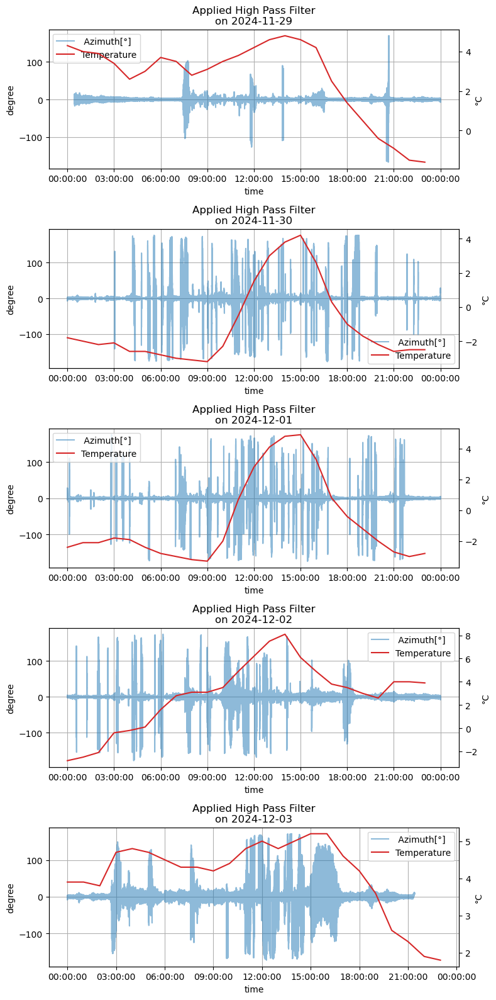

In [74]:
current = 0 # Temperature

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

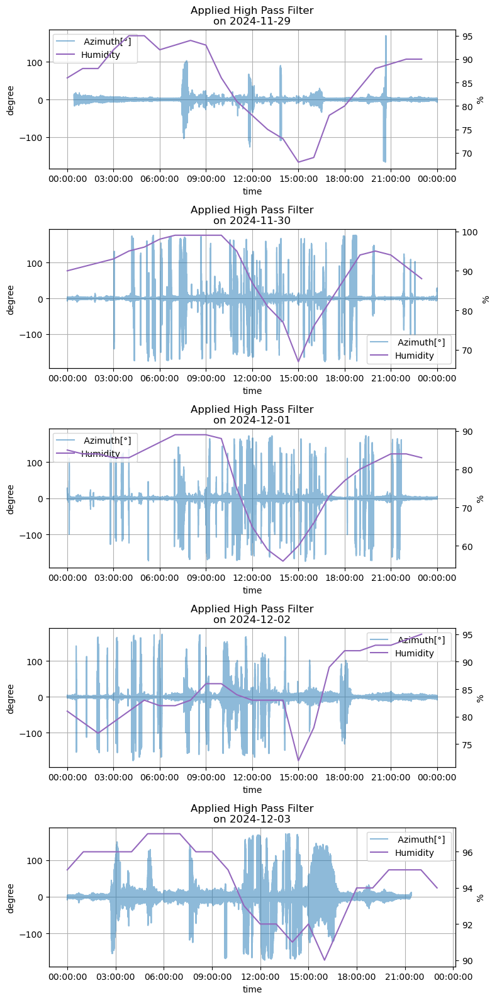

In [75]:
current = 1 # Humidity

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

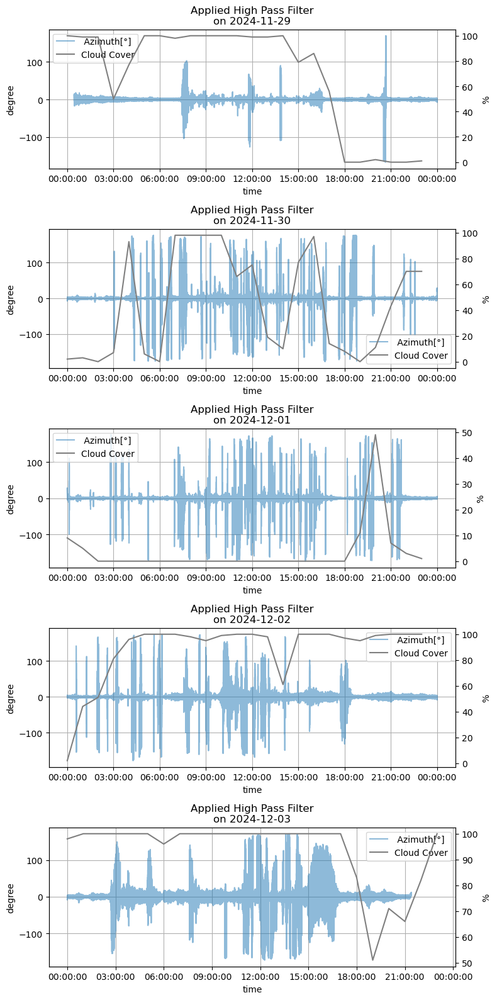

In [76]:
current = 2 # Cloud Cover

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

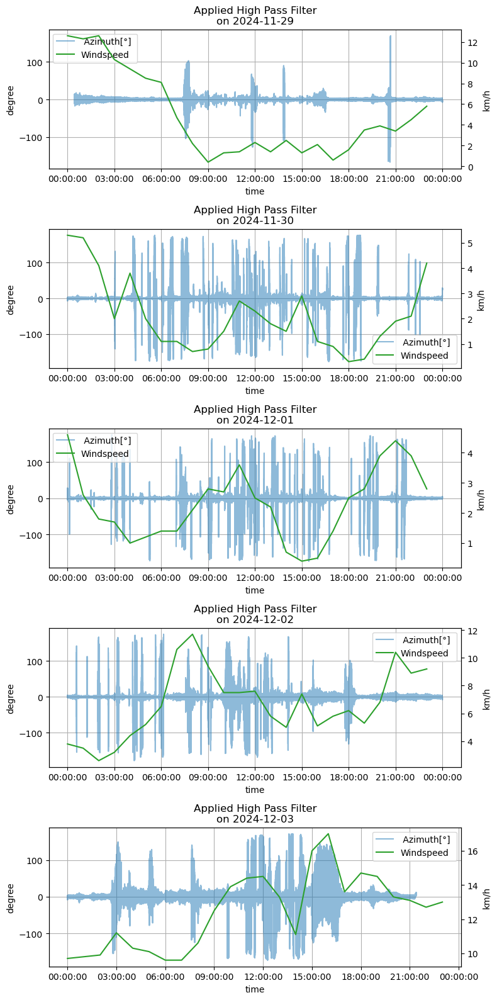

In [77]:
current = 3 # Windspeed

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

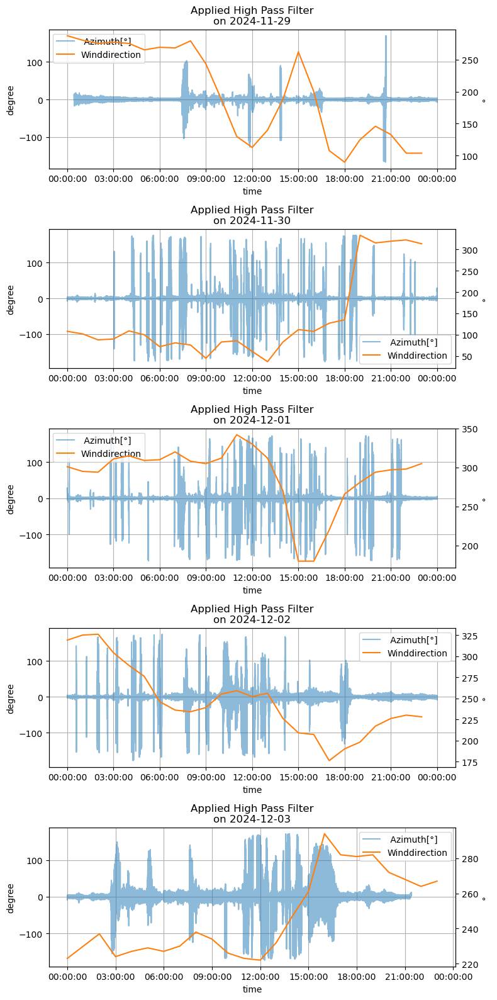

In [78]:
current = 4 # Winddirection

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

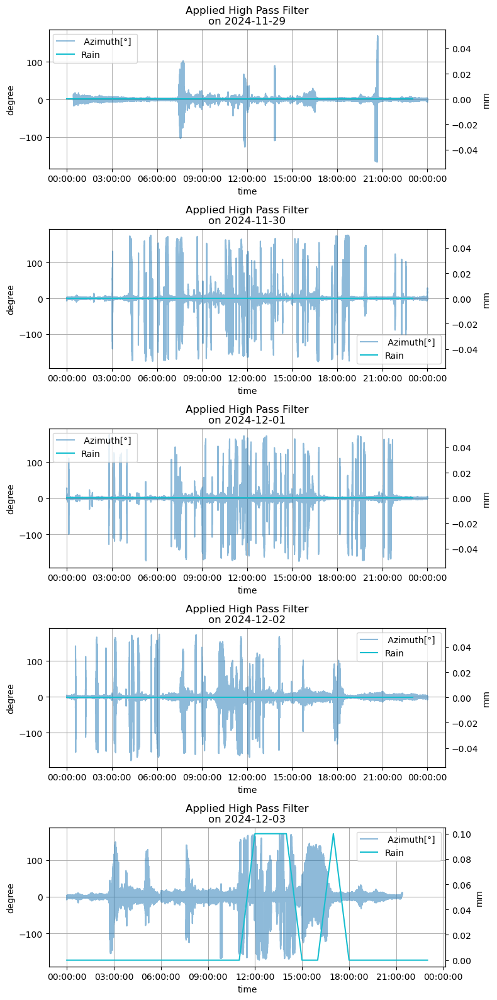

In [79]:
current = 5 # Rain

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[9], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

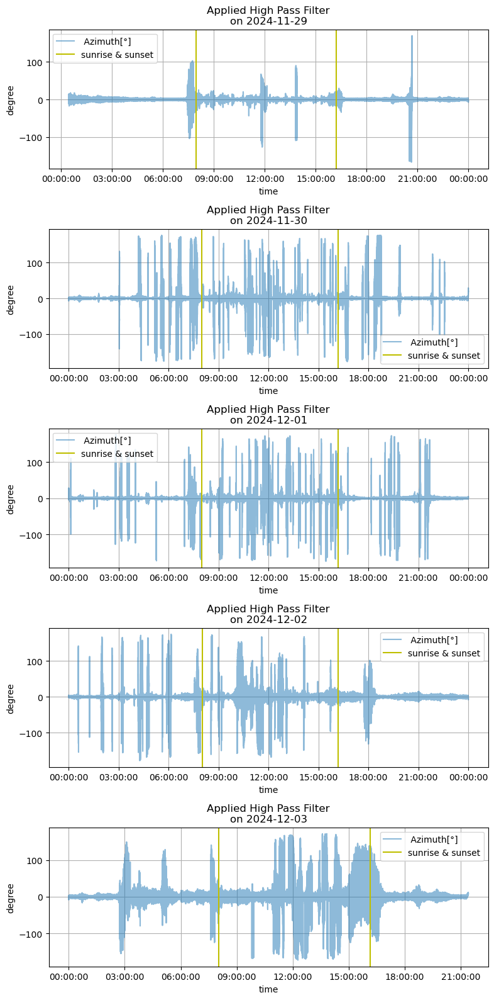

In [81]:
# Sunlight (day-night context)

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[9]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[9], alpha=0.5)
    ax1.axvline(x = sunrise[i], color = 'y')
    ax1.axvline(x = sunset[i], color = 'y', label = 'sunrise & sunset')
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    
    ax1.grid()
    ax1.legend(loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

<b>Ellipticity</b>

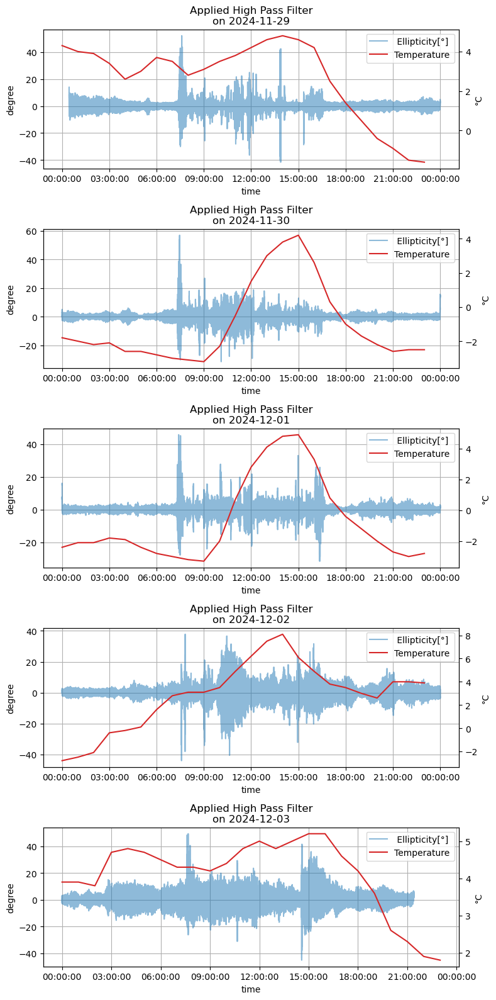

In [82]:
current = 0 # Temperature

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

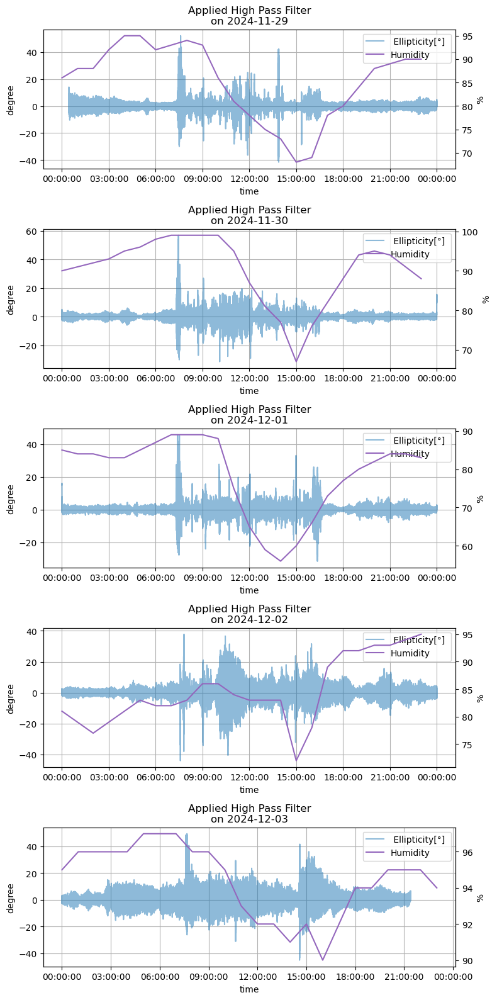

In [83]:
current = 1 # Humidity

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

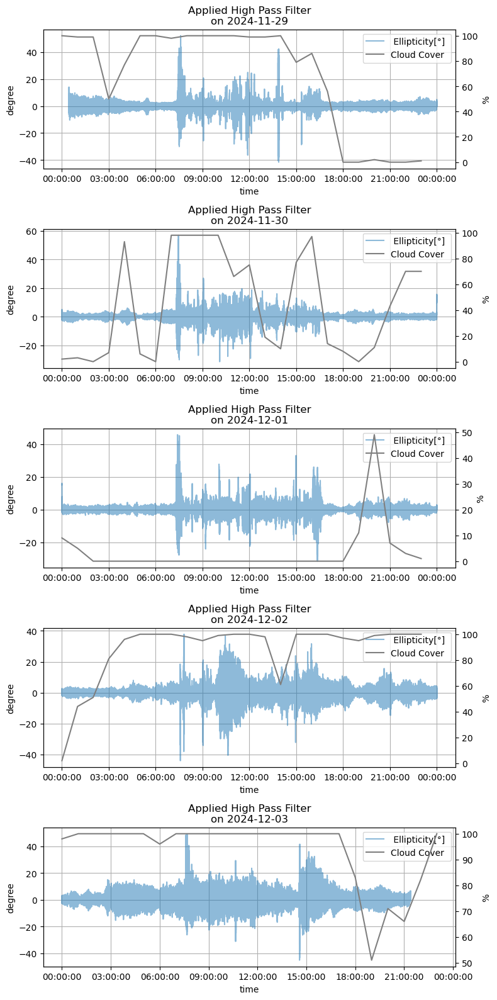

In [84]:
current = 2 # Cloud Cover

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

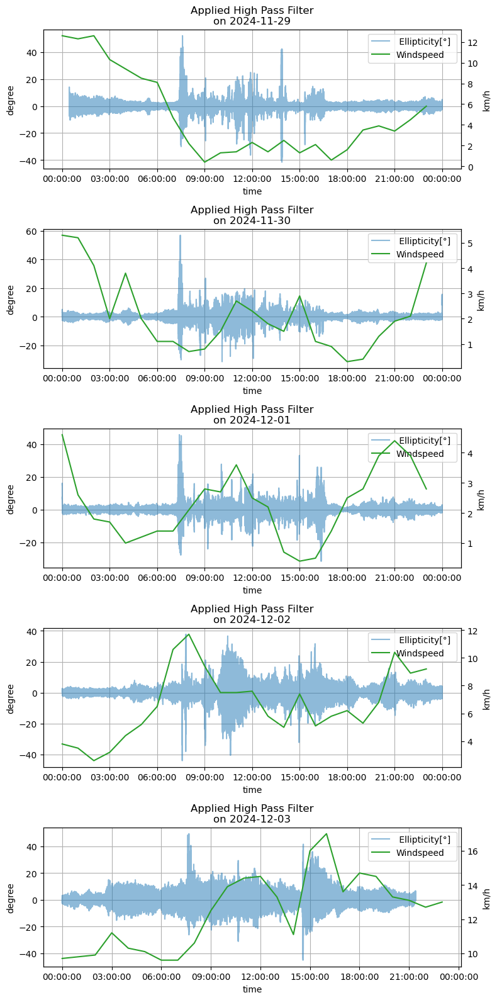

In [85]:
current = 3 # Windspeed

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

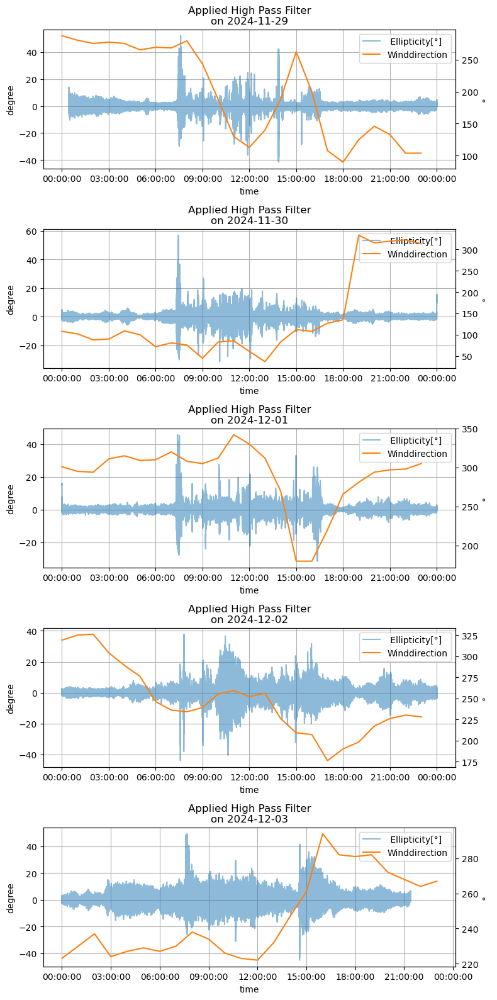

In [86]:
current = 4 # Winddirection

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

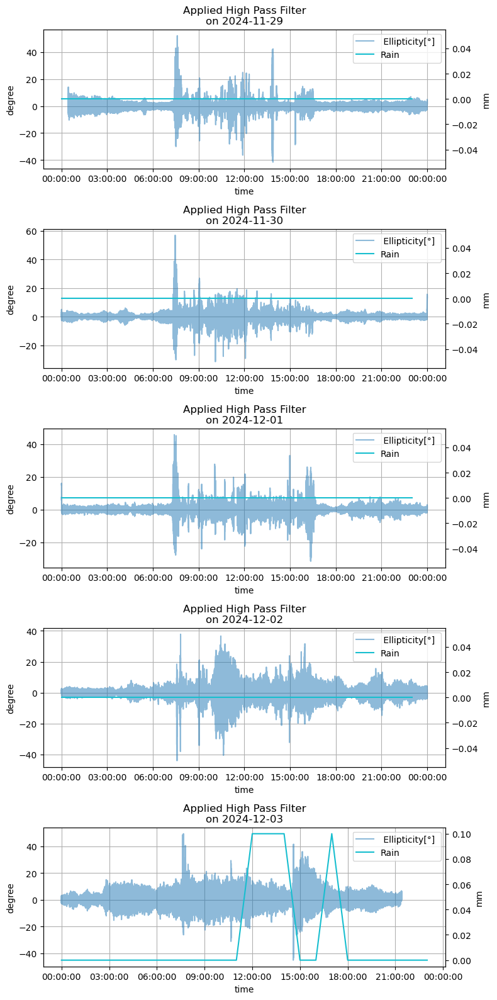

In [87]:
current = 5 # Rain

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[10], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

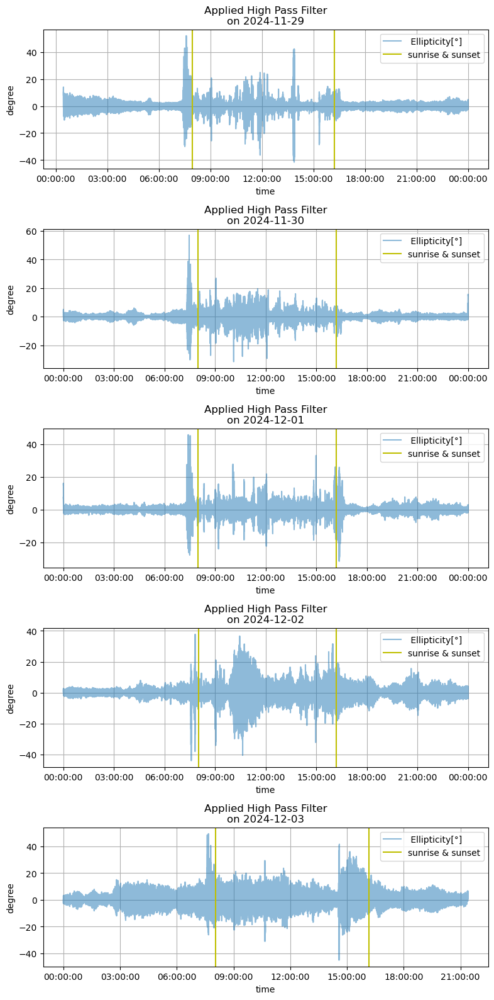

In [88]:
# Sunlight (day-night context)

fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    
    df_day = angle_daily_list[i][1][columns[10]]
    ydata = np.array(df_day)
    hps = highpass(ydata, 1000)

    ax1.plot(df_day.index, hps, label=columns[10], alpha=0.5)
    ax1.axvline(x = sunrise[i], color = 'y')
    ax1.axvline(x = sunset[i], color = 'y', label = 'sunrise & sunset')
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    
    ax1.grid()
    ax1.legend(loc="best")
    ax1.set_title(f'Applied High Pass Filter\non {degree_daily_list[i][0]}')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

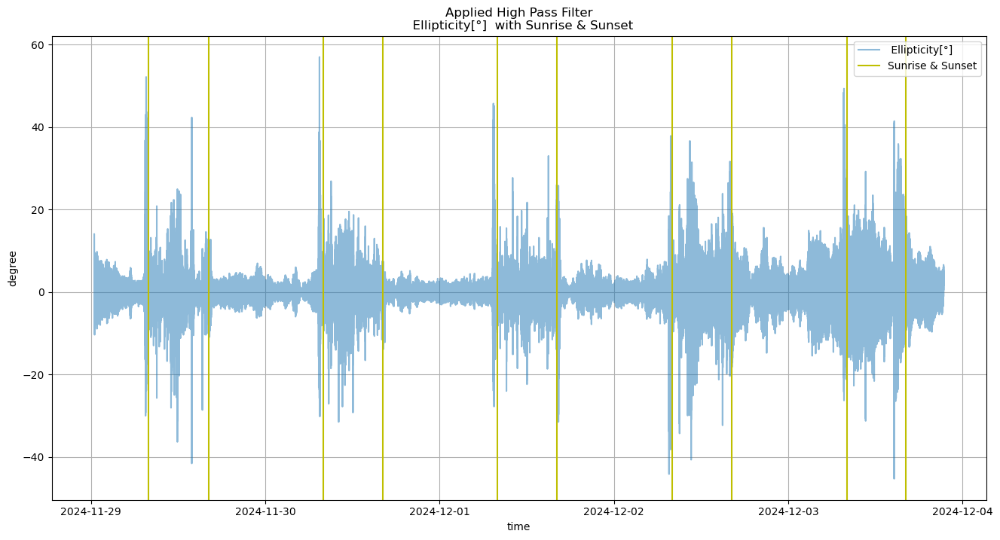

In [93]:
# Sunlight (day-night context)

plt.figure(figsize = (16,8))

ydata = np.array(angle[columns[10]])
hps = highpass(ydata, 1000)
plt.plot(angle.index, hps, label=columns[10], alpha= 0.5)

for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y')
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: plt.axvline(x = sunset[i], color = 'y')
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Applied High Pass Filter\n {columns[10]} with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('degree')
plt.show()

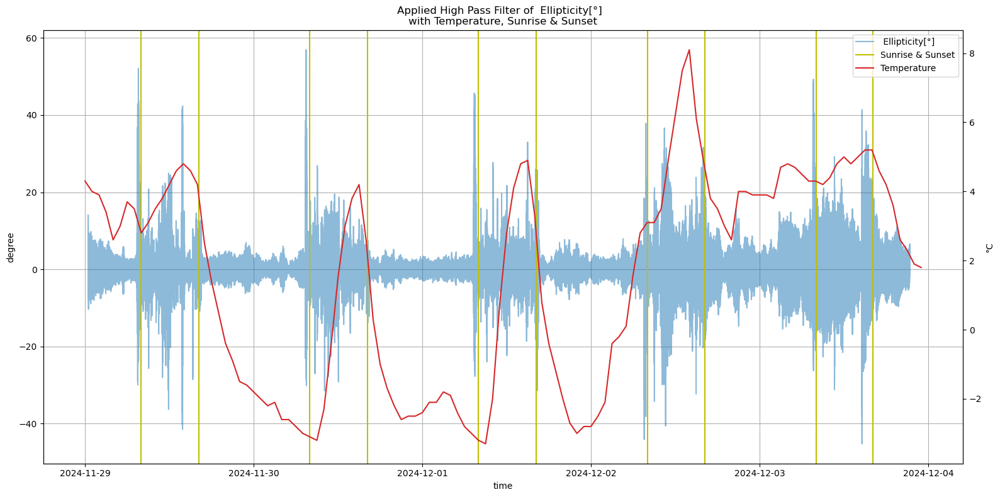

In [96]:
current = 0 #Temperature

fig, ax1 = plt.subplots(figsize=(16, 8))

ydata = np.array(angle[columns[10]])
hps = highpass(ydata, 1000)
ax1.plot(angle.index, hps, label=columns[10], alpha= 0.5)

for i in range(len(sunrise)):
    ax1.axvline(x = sunrise[i], color = 'y')
    if i == 0: ax1.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: ax1.axvline(x = sunset[i], color = 'y')

ax1.set_xlabel('time')
ax1.set_ylabel('degree')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Applied High Pass Filter of {columns[10]} \nwith {w_data[current]["label"]}, Sunrise & Sunset')
    
plt.tight_layout()
plt.show()

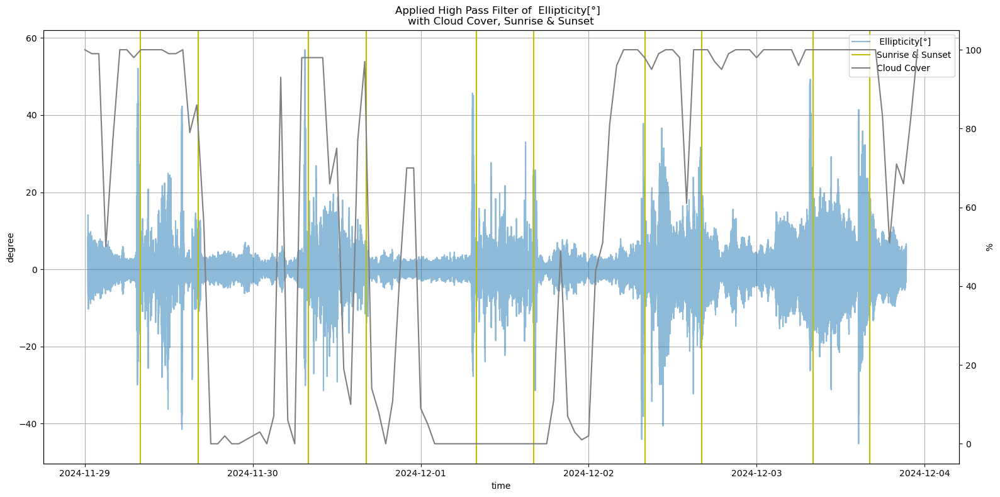

In [97]:
current = 2 #Cloud Cover

fig, ax1 = plt.subplots(figsize=(16, 8))

ydata = np.array(angle[columns[10]])
hps = highpass(ydata, 1000)
ax1.plot(angle.index, hps, label=columns[10], alpha= 0.5)

for i in range(len(sunrise)):
    ax1.axvline(x = sunrise[i], color = 'y')
    if i == 0: ax1.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: ax1.axvline(x = sunset[i], color = 'y')

ax1.set_xlabel('time')
ax1.set_ylabel('degree')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Applied High Pass Filter of {columns[10]} \nwith {w_data[current]["label"]}, Sunrise & Sunset')
    
plt.tight_layout()
plt.show()

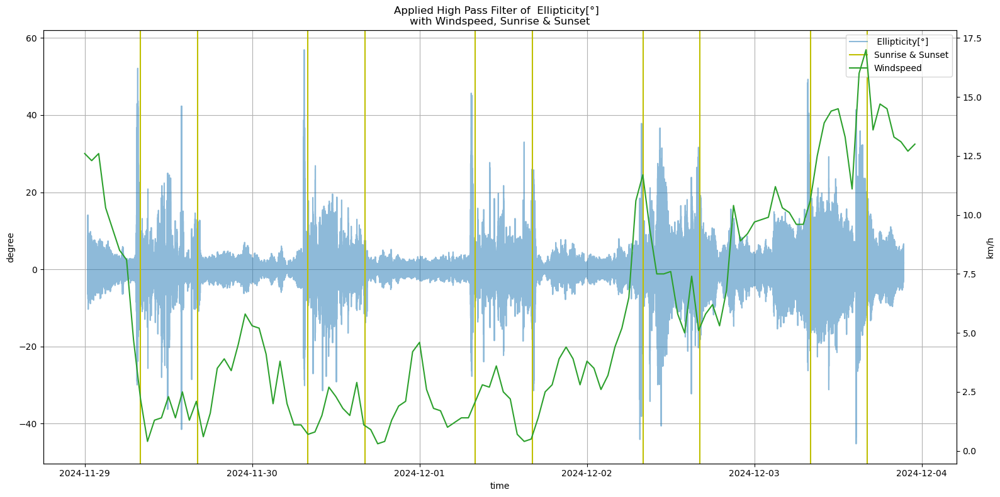

In [98]:
current = 3 #Windspeed

fig, ax1 = plt.subplots(figsize=(16, 8))

ydata = np.array(angle[columns[10]])
hps = highpass(ydata, 1000)
ax1.plot(angle.index, hps, label=columns[10], alpha= 0.5)

for i in range(len(sunrise)):
    ax1.axvline(x = sunrise[i], color = 'y')
    if i == 0: ax1.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: ax1.axvline(x = sunset[i], color = 'y')

ax1.set_xlabel('time')
ax1.set_ylabel('degree')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Applied High Pass Filter of {columns[10]} \nwith {w_data[current]["label"]}, Sunrise & Sunset')
    
plt.tight_layout()
plt.show()